# Ice video games Analysis

We will do a pattern analysis of the company's game sales.  the advertising budget.



## Opening and Exploring the Data

In [1]:
# add any required library or modules here:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
from scipy import stats as st
%matplotlib inline

In [2]:
# DISPLAY OPTIONS (uncomment and customize to activate)

# prevent annoying tendency of not displaying 'middle' columns if data is very wide
# change the max_columns value for even wider datasets

# pd.options.display.max_columns = None
pd.options.display.max_columns = 40

# see "all" the rows if needed
# change max_rows to desired number

pd.options.display.max_rows = None

# pd.reset_option('^display.', silent=True)

In [3]:
# READ IN DATASET(S)

df = pd.read_csv('/datasets/games.csv')


In [4]:
df.head()

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,8,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,8,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN


In [5]:
df.tail()

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.0,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.0,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.0,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.0,NaN,NaN,NaN
16714,Winning Post 8 2016,PSV,2016.0,Simulation,0.00,0.00,0.01,0.0,NaN,NaN,NaN


In [6]:
df.sample(10)

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
1850,Megamania,2600,1981.0,Shooter,1.03,0.06,0.00,0.01,NaN,NaN,NaN
1739,Mario vs. Donkey Kong,GBA,2004.0,Puzzle,0.68,0.25,0.21,0.02,81.0,8,E
14774,The Settlers II 10th Anniversary,PC,2006.0,Action,0.00,0.02,0.00,0.00,NaN,NaN,NaN
3671,American Idol,PS2,2003.0,Misc,0.27,0.21,0.00,0.07,41.0,4.8,E
830,Need For Speed: Undercover,PS3,2008.0,Racing,0.63,1.00,0.05,0.38,59.0,5.9,T
10120,Pac-Man Pinball Advance,GBA,2005.0,Misc,0.08,0.03,0.00,0.00,52.0,tbd,E
15490,Elminage Gothic: Ulm Zakir to Yami no Gishiki,PSP,2012.0,Role-Playing,0.00,0.00,0.02,0.00,NaN,NaN,NaN
67,Gran Turismo 2,PS,1999.0,Racing,3.88,3.42,1.69,0.50,93.0,9,T
4646,Zack & Wiki: Quest for Barbaros' Treasure,Wii,2007.0,Adventure,0.18,0.16,0.03,0.04,NaN,NaN,NaN
3587,Manhunt 2,PS2,2007.0,Action,0.27,0.21,0.00,0.07,67.0,7.8,M


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
Name               16713 non-null object
Platform           16715 non-null object
Year_of_Release    16446 non-null float64
Genre              16713 non-null object
NA_sales           16715 non-null float64
EU_sales           16715 non-null float64
JP_sales           16715 non-null float64
Other_sales        16715 non-null float64
Critic_Score       8137 non-null float64
User_Score         10014 non-null object
Rating             9949 non-null object
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


### First impressions
1. Lots of nulls, especially Critic_Score, User_Score, Rating
2. User_Score may need to be converted to float
3. Rating may need to be converted to float

In [8]:
df.shape

(16715, 11)

In [9]:
df.describe()

,Year_of_Release,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score
count,16446.000000,16715.000000,16715.000000,16715.000000,16715.000000,8137.000000
mean,2006.484616,0.263377,0.145060,0.077617,0.047342,68.967679
std,5.877050,0.813604,0.503339,0.308853,0.186731,13.938165
min,1980.000000,0.000000,0.000000,0.000000,0.000000,13.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,60.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,71.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,79.000000
max,2016.000000,41.360000,28.960000,10.220000,10.570000,98.000000


In [10]:
df.describe(include=['object'])

,Name,Platform,Genre,User_Score,Rating
count,16713,16715,16713,10014,9949
unique,11559,31,12,96,8
top,Need for Speed: Most Wanted,PS2,Action,tbd,E
freq,12,2161,3369,2424,3990


#### Categorical Data
Looks like there are identical titles, possibly the same title on different platforms, or sequels.  And again, why is User_Score categorical when Critic_Score is numerical?  Rating is the ESRB system -- maybe convert to a numeric representation if needed.

In [11]:
# search for 0 values
for i in df.columns:
    print(i, len(df[df[i] == 0]))

Name 0
Platform 0
Year_of_Release 0
Genre 0
NA_sales 4508
EU_sales 5870
JP_sales 10514
Other_sales 6601
Critic_Score 0
User_Score 0
Rating 0


#### Zero values
Sales columns have zero values, which makes sense, since some regions may not sell a particular game
All other columns have either regular values or NaN

In [12]:
# Let's take a closer preliminary look at the nulls
# separate out any rows that contain null values
# df_nulls = df[df.isnull().values.any(axis=1)][df.columns[df.isnull().any()]] # this only keeps columns with NaNs

df[df.isnull().any(axis=1)].sample(25)

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
3706,FIFA 99,N64,1998.0,Sports,0.11,0.39,0.00,0.03,NaN,NaN,NaN
12559,CyberTiger,N64,2000.0,Sports,0.05,0.01,0.00,0.00,NaN,NaN,NaN
9704,Colony Wars III: Red Sun,PS,2000.0,Simulation,0.07,0.05,0.00,0.01,NaN,NaN,NaN
15168,Winx Club: Rockstars,DS,2010.0,Adventure,0.00,0.02,0.00,0.00,NaN,NaN,E
1513,Test Drive 5,PS,1997.0,Racing,1.05,0.20,0.00,0.05,NaN,NaN,NaN
16019,Dragon Tales: Dragon Adventures,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN
1901,Joust,2600,1982.0,Platform,1.01,0.06,0.00,0.01,NaN,NaN,NaN
9866,Mountain Sports,Wii,2009.0,Sports,0.11,0.00,0.00,0.01,NaN,tbd,E
15488,Uta no * Prince-Sama,PSP,2010.0,Adventure,0.00,0.00,0.02,0.00,NaN,NaN,NaN
2676,Banjo-Kazooie: Nuts & Bolts,X360,2008.0,Platform,0.32,0.35,0.00,0.08,NaN,NaN,NaN


### EDA Conclusion

There a numerous missing values.  Especially in the columns Critic_Score, User_Score and Rating -- more than 8000 entries are missing Critic_Score ratings.

We may need to convert User_Score and Rating to a number type for manipulation


## Preparing the Data

### Replace column names (change to lowercase)

In [13]:
df.columns = df.columns.str.lower()

In [14]:
df.columns

Index(['name', 'platform', 'year_of_release', 'genre', 'na_sales', 'eu_sales',
       'jp_sales', 'other_sales', 'critic_score', 'user_score', 'rating'],
      dtype='object')

### Add Total Sales column

In [15]:
# speaking of sales, will add 'total_sales' now as it will come in handy
df['total_sales'] = df['na_sales'] + df['eu_sales'] + df['jp_sales'] + df['other_sales']

### Separate out Nulls
It may be easier on the kernel to work with JUST the entries containing NaNs

In [16]:
df_nulls = df[df.isnull().any(axis=1)]

### Converting to necessary types

Let's consider the entries with TBDs

#### TBD values

In [17]:
# separate out the tbds
df_tbds = df[df.apply(lambda r: r.str.contains('TBD', case=False).any(), axis=1)]

In [18]:
df_tbds.sample(30)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
5676,Goosebumps HorrorLand,DS,2008.0,Adventure,0.29,0.00,0.00,0.02,NaN,tbd,E10+,0.31
10153,Army Men: RTS,PS2,2002.0,Strategy,0.05,0.04,0.00,0.01,68.0,tbd,T,0.10
6405,Operation Armored Liberty,GBA,2003.0,Action,0.19,0.07,0.00,0.00,NaN,tbd,T,0.26
14048,Fading Shadows,PSP,2008.0,Puzzle,0.03,0.00,0.00,0.00,62.0,tbd,E,0.03
5953,Lupin the 3rd: Treasure of the Sorcerer King,PS2,2002.0,Adventure,0.02,0.02,0.25,0.01,67.0,tbd,T,0.30
9959,Disney Princess: Enchanting Storybooks,DS,2011.0,Misc,0.07,0.03,0.00,0.01,NaN,tbd,E,0.11
8214,Mark Davis Pro Bass Challenge,PS2,2002.0,Sports,0.09,0.07,0.00,0.02,NaN,tbd,E,0.18
14953,Drome Racers,GBA,2003.0,Racing,0.02,0.01,0.00,0.00,73.0,tbd,E,0.03
4190,Active Life: Extreme Challenge,Wii,2009.0,Sports,0.14,0.27,0.00,0.06,56.0,tbd,E,0.47
13124,Imagine: Artist,DS,2009.0,Misc,0.05,0.00,0.00,0.00,NaN,tbd,E,0.05


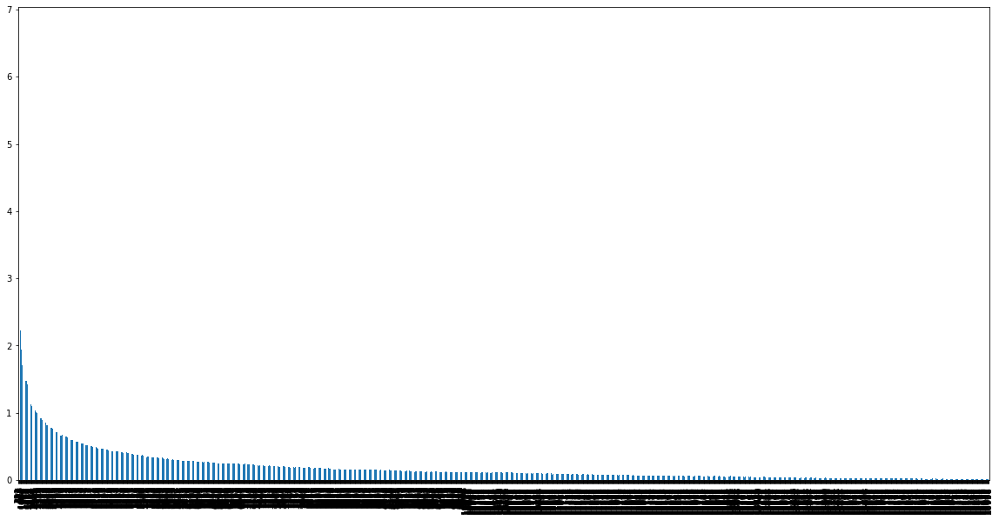

In [19]:
df_tbds['total_sales'].plot.bar(figsize=(20,10))

It appears that games with TBD's are low volume selling titles, which makes sense.  Perhaps there's a threshold that was not passed, so the rating was not generated.  The TBD would indicate that if/when the threshold is reached, then the user score would be validated and added.

### Nulls: Introduction

There are a lot of null values, particularly the Critic Score, User Score and Rating columns.

In [20]:
df_nulls

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN,30.26
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN,28.31
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,24.67
12,Pokemon Gold/Pokemon Silver,GB,1999.0,Role-Playing,9.00,6.18,7.20,0.71,NaN,NaN,NaN,23.09
18,Super Mario World,SNES,1990.0,Platform,12.78,3.75,3.54,0.55,NaN,NaN,NaN,20.62
20,Pokemon Diamond/Pokemon Pearl,DS,2006.0,Role-Playing,6.38,4.46,6.04,1.36,NaN,NaN,NaN,18.24
21,Super Mario Land,GB,1989.0,Platform,10.83,2.71,4.18,0.42,NaN,NaN,NaN,18.14
22,Super Mario Bros. 3,NES,1988.0,Platform,9.54,3.44,3.84,0.46,NaN,NaN,NaN,17.28


### Nulls: critic_score column
How important are missing Critic Scores?

In [21]:
print("Percentage of total games whose Critic Score is NaN is: ", len(df_nulls[df_nulls['critic_score'].isnull()])/df.shape[0])

Percentage of total games whose Critic Score is NaN is:  0.5131917439425665


##### 51% of games are missing Critic Scores
#### We can fill in the NaNs with average Critic Scores by genre

In [22]:
# We can see the average critic score differs from genre to genre
df.groupby(['genre'])['critic_score'].mean()

genre
Action          66.629101
Adventure       65.331269
Fighting        69.217604
Misc            66.619503
Platform        68.058350
Puzzle          67.424107
Racing          67.963612
Role-Playing    72.652646
Shooter         70.181144
Simulation      68.619318
Sports          71.968174
Strategy        72.086093
Name: critic_score, dtype: float64

In [23]:
df['critic_score'].fillna(df.groupby(['genre'])
                         ['critic_score']
                         .transform('mean'),
                         inplace=True)

In [24]:
df[df.isnull().any(axis=1)]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,68.058350,NaN,NaN,40.24
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,72.652646,NaN,NaN,31.38
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,67.424107,NaN,NaN,30.26
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,70.181144,NaN,NaN,28.31
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,68.619318,NaN,NaN,24.67
12,Pokemon Gold/Pokemon Silver,GB,1999.0,Role-Playing,9.00,6.18,7.20,0.71,72.652646,NaN,NaN,23.09
18,Super Mario World,SNES,1990.0,Platform,12.78,3.75,3.54,0.55,68.058350,NaN,NaN,20.62
20,Pokemon Diamond/Pokemon Pearl,DS,2006.0,Role-Playing,6.38,4.46,6.04,1.36,72.652646,NaN,NaN,18.24
21,Super Mario Land,GB,1989.0,Platform,10.83,2.71,4.18,0.42,68.058350,NaN,NaN,18.14
22,Super Mario Bros. 3,NES,1988.0,Platform,9.54,3.44,3.84,0.46,68.058350,NaN,NaN,17.28


In [25]:
df_nulls = df[df.isnull().any(axis=1)]

### Nulls: user_score column

user_score appears not to be numeric (currently an object type)

In [26]:
# take a look at what data is in user_score
df.groupby(['genre'])['user_score'].unique()

genre
Action          [8.2, 9, 8.1, 8.7, 8.5, 8.3, nan, 7.9, 7.5, 6....
Adventure       [nan, 7.7, 7.3, 8, 7.8, tbd, 9, 7.4, 8.2, 8.1,...
Fighting        [8.9, nan, 9.1, 7.3, 8.5, 8.6, 8.3, 7.9, 9.2, ...
Misc            [6.6, 6.3, 7.9, 7.8, 7.3, nan, 7.4, 8, 8.5, 8....
Platform        [nan, 8.5, 8.4, 8.9, 7.2, 9.1, 8.6, 6.8, 7.8, ...
Puzzle          [nan, 7.1, 8.6, 8.8, 9.2, 7.8, 7.4, 7.7, 8.7, ...
Racing          [8.3, 8.6, 8.4, 8.2, 8.5, 8.7, 7.5, nan, 9, 9....
Role-Playing    [nan, 9.2, 8.4, 8.7, 8.6, 8.5, 6.5, 6.4, 9, 8....
Shooter         [nan, 3.4, 6.3, 5.3, 4.8, 3.2, 6.4, 7.8, 2.6, ...
Simulation      [nan, 8.7, 7.6, 7.2, 8, 7.3, 9.1, 8.9, 7.8, 6....
Sports          [8, 7.7, 7.4, 4.3, nan, 5, tbd, 5.7, 8.5, 9.2,...
Strategy        [nan, 8.2, 7.2, 9, 8.3, 7.9, 8.7, 6.9, 7, 8.9,...
Name: user_score, dtype: object

#### Convert user_score type
Besides the numeric score, the user_score column also contains 'tbd' as a string -- and thus we cannot perform aggregate functions.  Let's replace 'tbd' with 0 and convert the column type to float

In [27]:
df.user_score.replace(to_replace =['tbd'],  
                            value = 0, inplace=True) 

In [28]:
df.user_score = df['user_score'].astype(float) 

In [29]:
df.groupby(['genre'])['user_score'].mean()

genre
Action          5.851723
Adventure       4.662092
Fighting        6.652283
Misc            3.371284
Platform        5.511464
Puzzle          2.709145
Racing          5.160412
Role-Playing    7.323803
Shooter         6.360411
Simulation      4.224269
Sports          5.064776
Strategy        6.482286
Name: user_score, dtype: float64

In [30]:
df.groupby(['genre'])['user_score'].unique()

genre
Action          [8.2, 9.0, 8.1, 8.7, 8.5, 8.3, nan, 7.9, 7.5, ...
Adventure       [nan, 7.7, 7.3, 8.0, 7.8, 0.0, 9.0, 7.4, 8.2, ...
Fighting        [8.9, nan, 9.1, 7.3, 8.5, 8.6, 8.3, 7.9, 9.2, ...
Misc            [6.6, 6.3, 7.9, 7.8, 7.3, nan, 7.4, 8.0, 8.5, ...
Platform        [nan, 8.5, 8.4, 8.9, 7.2, 9.1, 8.6, 6.8, 7.8, ...
Puzzle          [nan, 7.1, 8.6, 8.8, 9.2, 7.8, 7.4, 7.7, 8.7, ...
Racing          [8.3, 8.6, 8.4, 8.2, 8.5, 8.7, 7.5, nan, 9.0, ...
Role-Playing    [nan, 9.2, 8.4, 8.7, 8.6, 8.5, 6.5, 6.4, 9.0, ...
Shooter         [nan, 3.4, 6.3, 5.3, 4.8, 3.2, 6.4, 7.8, 2.6, ...
Simulation      [nan, 8.7, 7.6, 7.2, 8.0, 7.3, 9.1, 8.9, 7.8, ...
Sports          [8.0, 7.7, 7.4, 4.3, nan, 5.0, 0.0, 5.7, 8.5, ...
Strategy        [nan, 8.2, 7.2, 9.0, 8.3, 7.9, 8.7, 6.9, 7.0, ...
Name: user_score, dtype: object

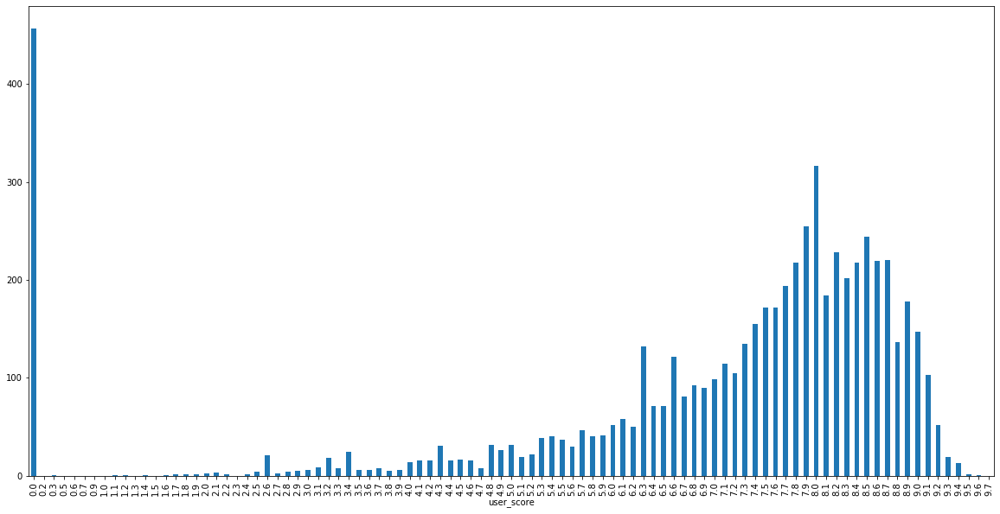

In [31]:
df.groupby(['user_score'])['total_sales'].sum().plot.bar(figsize=(20,10))

### Nulls: rating column

The ESRB Ratings are determined by the content/gameplay of the game.  We might assume that there might be a relationship between genre and rating.  Can we assume there might be a relationship between genre and a rating of "none"?  Let's see:

#### Null Ratings by Genre
Compare a count of game titles with a count of ratings.  If rating counts are less than title counts, then the difference is the count of Nulls for that genre

In [32]:
df_nulls_genre = df_nulls[['genre','name','rating']].groupby(['genre']).count().sort_values(by = 'genre').reset_index()

In [33]:
df_nulls_genre

,genre,name,rating
0,Action,1234,53
1,Adventure,873,16
2,Fighting,419,8
3,Misc,893,25
4,Platform,329,10
5,Puzzle,250,12
6,Racing,400,23
7,Role-Playing,734,13
8,Shooter,328,24
9,Simulation,318,13


##### All genres have entries with Nulls.  There is no direct relationship between genre and ratings in general

#### Number of Null Ratings by Platform
Compare the count of titles and count of ratings.

In [34]:
# df_nulls_platform = df_nulls[['platform','name','rating']].groupby(['platform']).count().sort_values(by='platform').reset_index()
df_nulls_platform = df[['platform','name','rating']].groupby(['platform']).count().sort_values(by='rating').reset_index()

In [35]:
df_nulls_platform

,platform,name,rating
0,2600,133,0
1,PCFX,1,0
2,SCD,6,0
3,NG,12,0
4,NES,98,0
5,N64,319,0
6,GG,1,0
7,SAT,173,0
8,GEN,27,0
9,TG16,2,0


#### Older platforms have no ratings
We can see all the early game consoles -- Atari 2600, NES, etc -- did not have any games with an ESRB rating.  This makes sense since the rating system was only introduced in 1993-1994.  By that time, most of the early consoles had already been discontinued.

In [36]:
# let's confirm by comparing with overall dataset
# df_platform = df[['platform','year_of_release','rating']].groupby(['platform']).count().sort_values(by='rating').reset_index()

In [37]:
df_rating_by_platform = pd.pivot_table(df,
                            index='platform',
                            columns='year_of_release',
                            values='rating',
                            aggfunc={'rating':'count'})

In [38]:
df_rating_by_platform

year_of_release,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,1990.0,1991.0,1992.0,1993.0,1994.0,1995.0,1996.0,1997.0,1998.0,1999.0,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
platform,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3DO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3DS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.0,38.0,30.0,31.0,29.0,14.0
DC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,3.0,7.0,4.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DS,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,78.0,117.0,219.0,302.0,259.0,179.0,74.0,9.0,6.0,NaN,NaN,NaN
GB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GBA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,74.0,139.0,109.0,106.0,65.0,20.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.0,135.0,116.0,70.0,76.0,34.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GEN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can see from the above detailed chart of the count of ratings by platform over time.  Ratings only appear after 1994.  (One exception is the PC, but those total of 4 titles could be special cases.  The PC is not a single "console", but any desktop running early Windows software on Intel CPU's.)

In [39]:
df_sales_by_platform = pd.pivot_table(df,
                            index='platform',
                            columns='year_of_release',
                            values='total_sales',
                            aggfunc={'total_sales':'sum'})

In [40]:
df_sales_by_platform

year_of_release,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,1990.0,1991.0,1992.0,1993.0,1994.0,1995.0,1996.0,1997.0,1998.0,1999.0,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
platform,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2600,11.38,35.68,28.88,5.84,0.27,0.45,0.67,1.94,0.74,0.63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3DO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3DS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.20,51.36,56.57,43.76,27.78,15.14
DC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.38,5.16,5.99,1.07,0.29,NaN,NaN,NaN,NaN,0.02,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DS,NaN,NaN,NaN,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.27,130.14,119.81,146.94,145.31,119.54,85.02,26.18,11.01,1.54,NaN,NaN,NaN
GB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.43,64.97,4.89,5.57,25.49,NaN,12.18,3.60,36.03,6.37,26.90,38.00,19.76,9.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GBA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.07,61.53,74.16,56.67,77.91,33.86,5.28,3.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.34,51.81,50.61,28.82,27.62,11.26,0.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GEN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.60,4.33,12.64,3.07,8.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Explaining why some post-1994 platforms (i.e. released after establishment of ESRB) had no ratings
Okay, I think it's safe to say that certain platforms, like the Nintendo GB (Gameboy), DS or Wii, are geared toward younger players or family settings, and it's assumed that games put out on those platforms are all "safe", thus, not need a rating.

Second, it seems that if a title has very low sales, there is often no ratings or scores.

### Rating Nulls explained
The ESRB was founded in 1994, after the release of the first gory fighting game, Mortal Kombat, on game consoles in 1992 caused an uproar.

So games prior to 1994 (or October, 1992, when the game was released) would not have been rated, and if they had been, should at most be rated "T" for teen.  Certain platforms like the Atari 2600 and other early game consoles would all be rated "E".

Second, there were also platforms like the Nintendo Gameboy and N64 that appear not to have any games rated.  A possible explaination is that these platforms were already aimed at a very youthful demographic, and game makers knew that and only made family-friendly fare for these platforms.


In [41]:
df_pre_1994 = df.loc[df['year_of_release'] <= 1994]

In [42]:
df_pre_1994.total_sales.sum()

661.88

In [43]:
df_post_1994 = df.loc[df['year_of_release'] > 1994]

In [44]:
df_post_1994.total_sales.sum()

8154.910000000001

In [45]:
df.total_sales.sum()

8915.71

#### Games after 1994 with NaN's
From this sample, it appears that the games after 1994 that contain NaN's are ones that sold very few units  -- 571 out of 7386 titles.  That makes 7% out of the entire history of console game titles.

Perhaps the low sales was not enough to warrant reviews by critics and users, and thus no rating either.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f784b426f10>,
      dtype=object)

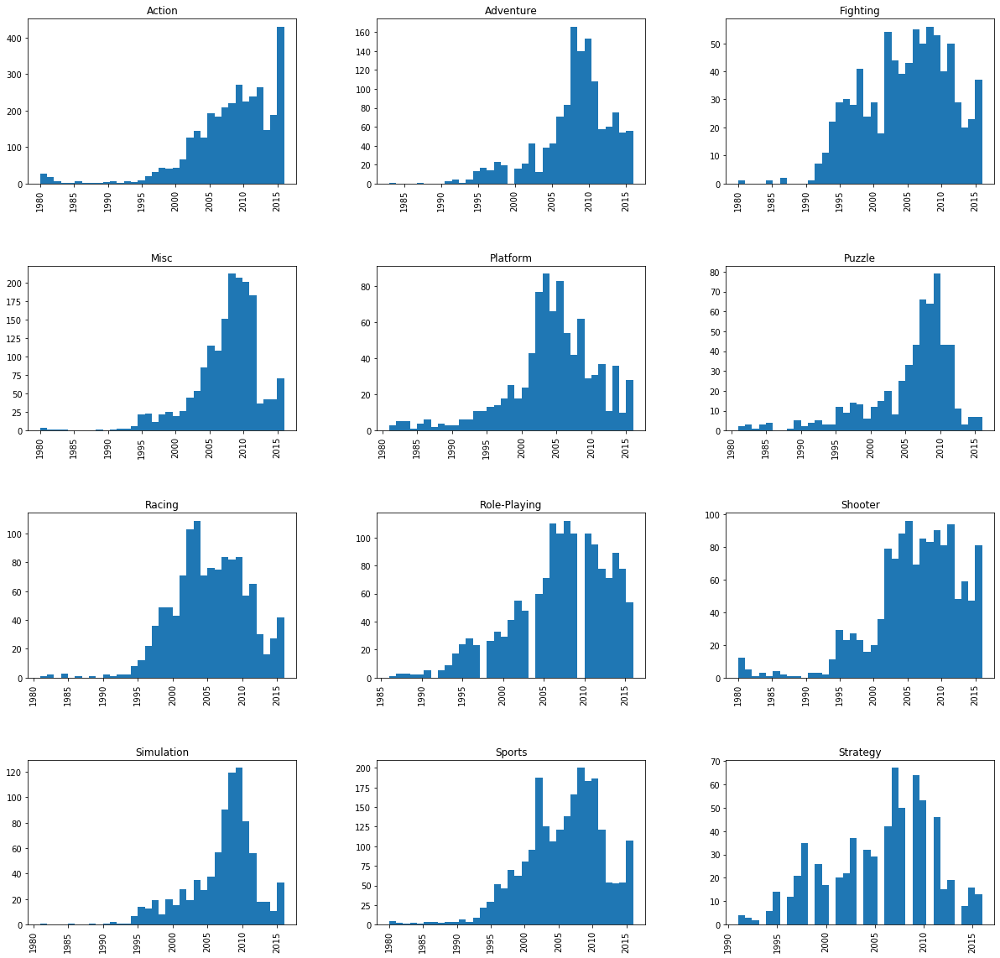

In [46]:
# Let's take a quick visualization of the data as well
df['year_of_release'].hist(df['genre'], bins=35, figsize=(20,20))

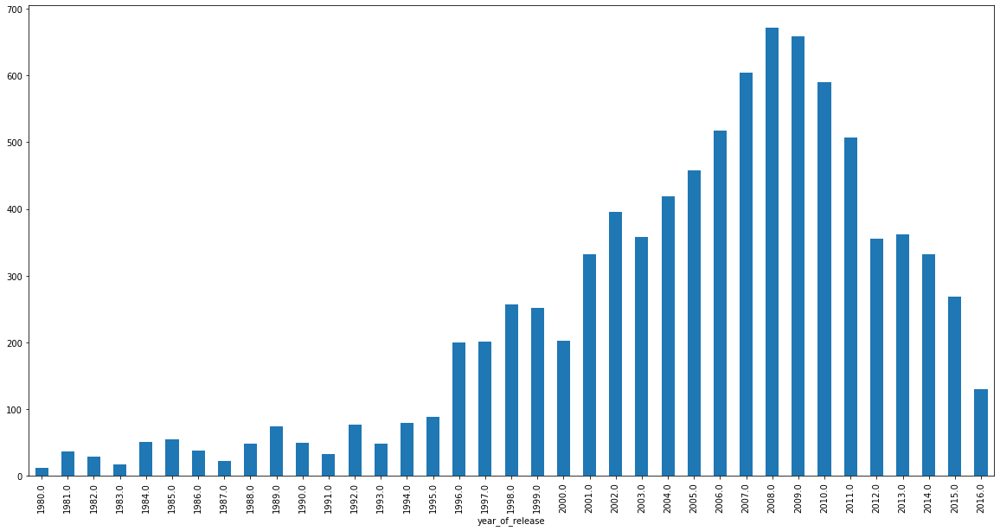

In [1031]:
df.groupby(['year_of_release'])['total_sales'].sum().plot.bar(figsize=(20,10))

We can also see from the visualizations that many platforms took off in the 90's - mid-90's, corresponding to when increasingly more powerful game platforms (as well as PC's) came to the mass markets.  

It is interesting to note the downward trend, however, after 2009/2010.

One distinct possible explanation is the (probable) rise in gaming on mobile devices such as smart phones and tablets.  For a truly comprehensive analysis, we should really include the newer devices.

### Eliminate erroroneous data

Since pre-1994 sales account for only 7% of cumulative sales from this dataset, any kind of analysis on the old games probably has little relevance today.  So, we will drop these entries.

In [49]:
df_new = df_post_1994

## Analyze the Data

Look at how many games were released in different years. Is the data for every period significant?

Look at how sales varied from platform to platform. Choose the platforms with the greatest total sales and build a distribution based on data for each year. Find platforms that used to be popular but now have zero sales. How long does it generally take for new platforms to appear and old ones to fade?

Determine what period you should take data for. To do so, look at your answers to the previous questions. The data should allow you to build a prognosis for 2017.

Work only with the data that you've decided is relevant. Disregard the data for previous years.

Which platforms are leading in sales? Which ones are growing or shrinking? Select several potentially profitable platforms.

Build a box plot for the global sales of all games, broken down by platform. Are the differences in sales significant? What about average sales on various platforms? Describe your findings.

Take a look at how user and professional reviews affect sales for one popular platform (you choose). Build a scatter plot and calculate the correlation between reviews and sales. Draw conclusions.

Keeping your conclusions in mind, compare the sales of the same games on other platforms.

Take a look at the general distribution of games by genre. What can we say about the most profitable genres? Can you generalize about genres with high and low sales?



### Look at how many games were released in different years. Is the data for every period significant?
#### Games released by year

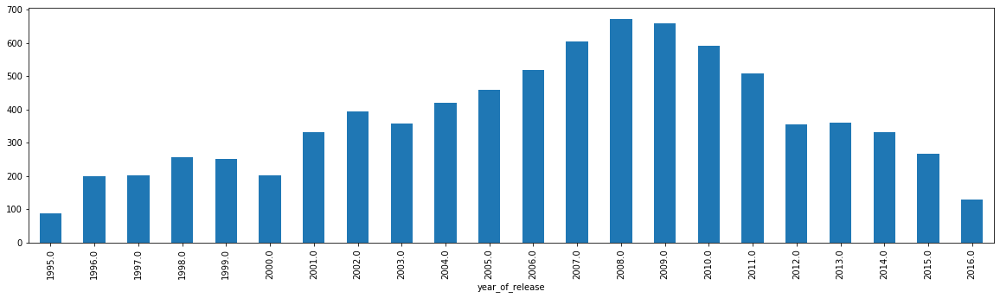

In [50]:
df_new.groupby(['year_of_release'])['total_sales'].sum().plot.bar(figsize=(20,5))

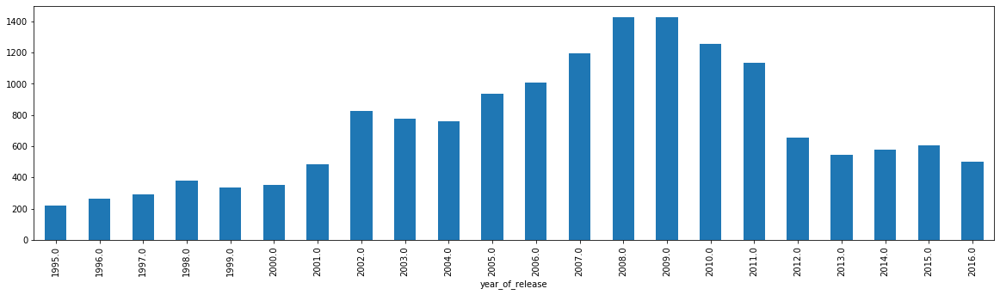

In [51]:
df_new.groupby(['year_of_release'])['name'].count().plot.bar(figsize=(20,5))

#### Highest number of games released and total sales by year
The graph indicates that the highest number of games on the market during this period occurred in 2008-2009.  Total sales also match the two years.  The subsequent drop off of game titles perhaps coincides with the Great Recession, with a slow pick up finally taking place from 2012-2015.  In 2016, sales dipped a bit.  The overall downward trend since 2009 might also have something to do with the proliferation of smart phones and tablets.  It would be interesting to include as Platform sales for games on these newer mobile devices.

### Look at how sales varied from platform to platform

#### Choose the platforms with the greatest total sales and build a distribution based on data for each year

In [52]:
df_sales_by_platform

year_of_release,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,1990.0,1991.0,1992.0,1993.0,1994.0,1995.0,1996.0,1997.0,1998.0,1999.0,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
platform,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2600,11.38,35.68,28.88,5.84,0.27,0.45,0.67,1.94,0.74,0.63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3DO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3DS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.20,51.36,56.57,43.76,27.78,15.14
DC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.38,5.16,5.99,1.07,0.29,NaN,NaN,NaN,NaN,0.02,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DS,NaN,NaN,NaN,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.27,130.14,119.81,146.94,145.31,119.54,85.02,26.18,11.01,1.54,NaN,NaN,NaN
GB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.43,64.97,4.89,5.57,25.49,NaN,12.18,3.60,36.03,6.37,26.90,38.00,19.76,9.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GBA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.07,61.53,74.16,56.67,77.91,33.86,5.28,3.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.34,51.81,50.61,28.82,27.62,11.26,0.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GEN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.60,4.33,12.64,3.07,8.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Find platforms that used to be popular but now have zero sales

Platforms that were popular in their day were:

Atari 2600

Nintendo NES

Nintendo Gameboy

Nintendo Gameboy Advanced

Nintendo N64

Nintendo SNES

Sony Playstation

Sony Playstation 2


#### How long does it generally take for new platforms to appear and old ones to fade?

There is no set period for when a new platform appears.  With such a small population size, it seems to depend on popularity of a platform's games.  We know that the Mario franchise is exclusive to Nintendo, for instance, and so certain game franchises that catch on probably dictates when an upgraded platform appears.

Sony, for instance, with their Playstation, seems to have a 5 year cadence.  The "sequal" console arrives about five year in, and the "father" hardware still sells games for another five years, lasting altogether about ten years per platform.

Nintendo, on the other hand, had the Gameboy selling for 12 years, with the sequal Gameboy Advanced, arriving in year 10.  However, only 5 years after that, the Nintendo DS appeared, which lasted another 10 years.  Nintendo's NES lasted also for 12 years, and the SNES appeared in year 10, lasting another 10, during year 7 of which appeared the N64, which lasted just over 6 years.

Thus, there is really no set pattern.  The best a console can do is around a dozen years.  And the quickest a new "sequel" console arrives is about 4-5 years.

## Determine what period you should take data for
To do so, look at your answers to the previous questions. The data should allow you to build a prognosis for 2017.

For prognosticating, we will use the post-1994 game sales data as needed.  This DataFrame will be called df_new

### Games by Platform

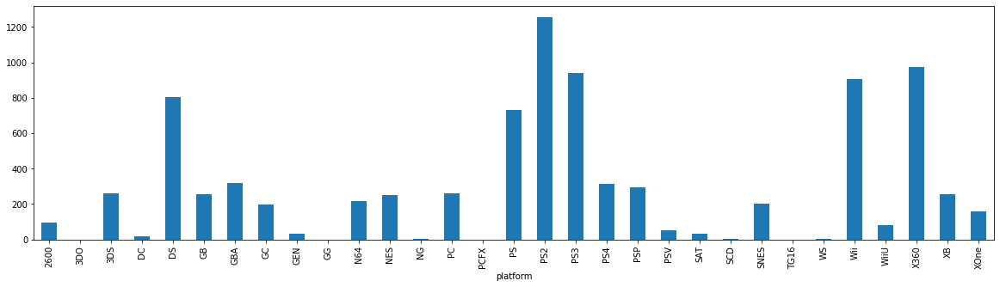

In [53]:
df_sales_by_platform = df.groupby(['platform'])

df_sales_by_platform['total_sales'].sum().plot.bar(figsize=(20,5))

### Top 5 Platforms all time

In [54]:
print('The top five platforms in terms of game sales from 1980 - 2016 are:\n',
      df_sales_by_platform['total_sales']
      .sum().sort_values(ascending=False)
      .head()  
     )

The top five platforms in terms of game sales from 1980 - 2016 are:
 platform
PS2     1255.77
X360     971.42
PS3      939.65
Wii      907.51
DS       806.12
Name: total_sales, dtype: float64


#### Platform PS2: Sony Playstation 2

In [55]:
df_ps2 = df[df['platform'] == 'PS2']

#### PS2 game sales by genre

In [56]:
# PS2 game sales by genre
df_ps2[['genre','name','total_sales']].groupby(['genre']).sum().sort_values(by = 'total_sales', ascending=False)

,total_sales
genre,
Sports,273.48
Action,272.71
Racing,156.39
Shooter,108.49
Misc,101.09
Role-Playing,93.55
Fighting,92.61
Platform,72.54
Simulation,42.65


#### PS2 game sales by year

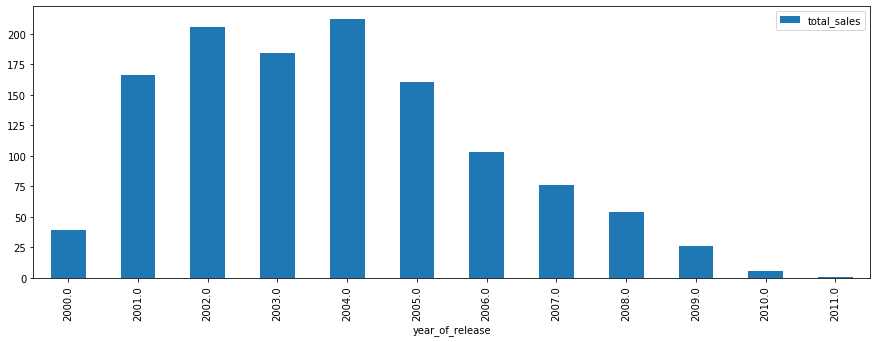

In [57]:
# PS2 game sales by year
df_ps2[['year_of_release','total_sales']].groupby(['year_of_release']).sum().plot.bar(figsize = (15,5))

#### Platform X360: Microsoft XBox 360

In [58]:
df_x360 = df_new[df_new['platform'] == 'X360']

#### X360 game sales by genre

In [59]:
# XBox 360 game sales by genre
df_x360[['genre','name','total_sales']].groupby(['genre']).sum()

,total_sales
genre,
Action,236.71
Adventure,14.89
Fighting,37.32
Misc,88.95
Platform,11.29
Puzzle,0.73
Racing,64.13
Role-Playing,71.39
Shooter,275.62


#### X360 game sales by year

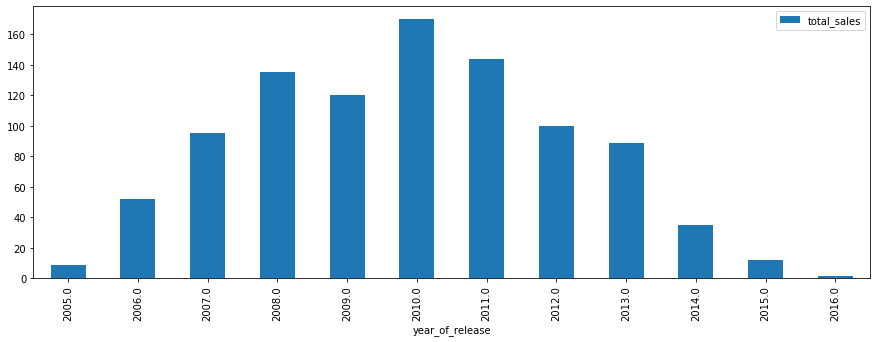

In [60]:
# XBox 360 game sales by year
df_x360[['year_of_release','total_sales']].groupby(['year_of_release']).sum().plot.bar(figsize = (15,5))

#### Platform PS3: Sony Playstation 3

In [61]:
df_ps3 = df_new[df_new['platform'] == 'PS3']

#### PS3 game sales by genre

In [62]:
# PS3 game sales by genre
df_ps3[['genre','name','total_sales']].groupby(['genre']).sum().sort_values(by = 'total_sales', ascending=False)

,total_sales
genre,
Action,297.87
Shooter,192.29
Sports,133.15
Role-Playing,73.65
Racing,71.31
Fighting,51.11
Misc,44.93
Platform,29.32
Adventure,22.28


#### PS3 game sales by year

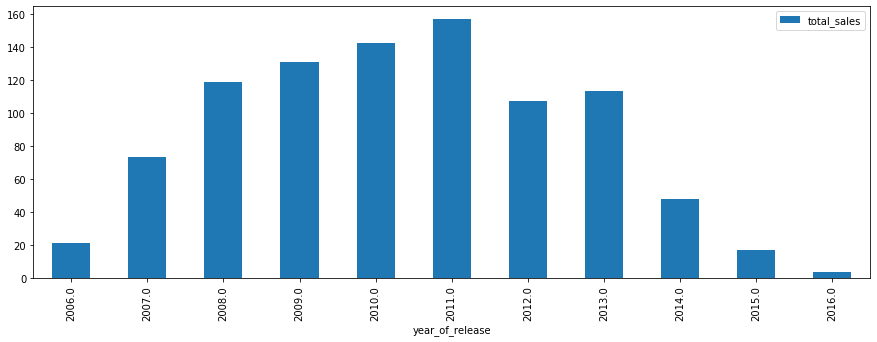

In [63]:
# PS3 game sales by year
df_ps3[['year_of_release','total_sales']].groupby(['year_of_release']).sum().plot.bar(figsize = (15,5))

#### Platform Wii: Nintendo Wii

In [64]:
df_wii = df_new[df_new['platform'] == 'Wii']

#### Wii game sales by genre

In [65]:
# Wii game sales by genre
df_wii[['genre','name','total_sales']].groupby(['genre']).sum().sort_values(by='total_sales', ascending=False)

,total_sales
genre,
Sports,286.49
Misc,212.67
Action,106.67
Platform,88.87
Racing,60.13
Simulation,35.57
Shooter,25.69
Fighting,23.36
Adventure,17.70


#### Wii game sales by year

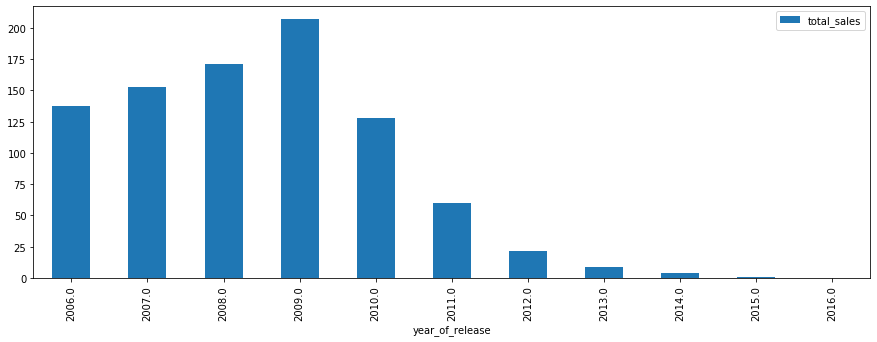

In [66]:
# Wii game sales by year
df_wii[['year_of_release','total_sales']].groupby(['year_of_release']).sum().plot.bar(figsize = (15,5))

#### Platform DS: Nintendo DS

In [67]:
df_ds = df[df['platform'] == 'DS']

#### DS game sales by genre

In [68]:
# DS game sales by genre
df_ds[['genre','name','total_sales']].groupby(['genre']).sum().sort_values(by = 'total_sales', ascending=False)

,total_sales
genre,
Misc,135.64
Simulation,129.98
Role-Playing,124.45
Action,112.58
Puzzle,82.48
Platform,75.83
Adventure,45.97
Racing,38.00
Sports,31.38


#### DS game sales by year

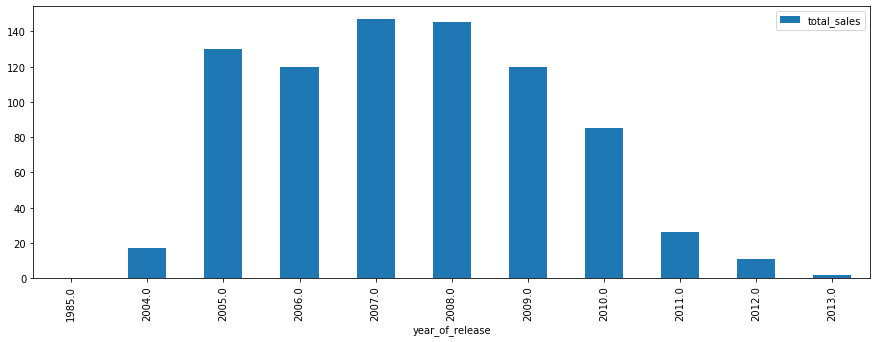

In [69]:
# DS game sales by year
df_ds[['year_of_release','total_sales']].groupby(['year_of_release']).sum().plot.bar(figsize = (15,5))

### Games by Genre

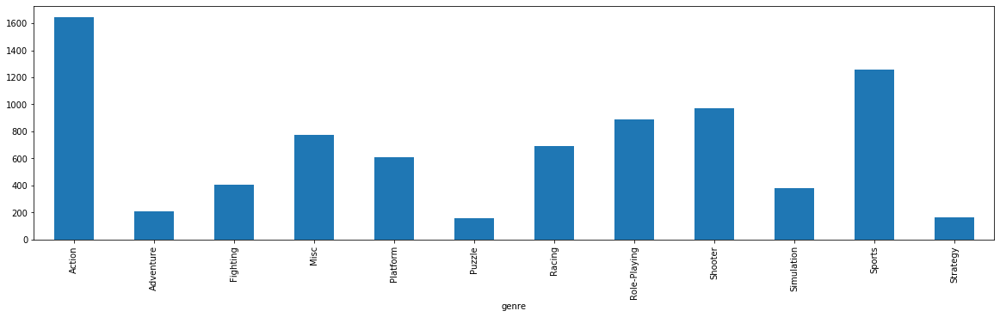

In [70]:
game_sales_by_genre = df_new.groupby(['genre'])

game_sales_by_genre['total_sales'].sum().plot.bar(figsize=(20,5))

### Top Genres

In [71]:
print('The top five platforms in terms of game sales from 1994 - 2016 are:\n',
      game_sales_by_genre['total_sales']
      .sum().sort_values(ascending=False)
        
     )

The top five platforms in terms of game sales from 1994 - 2016 are:
 genre
Action          1645.07
Sports          1258.33
Shooter          967.94
Role-Playing     888.47
Misc             773.67
Racing           692.41
Platform         611.83
Fighting         402.57
Simulation       379.12
Adventure        210.25
Strategy         166.88
Puzzle           158.37
Name: total_sales, dtype: float64


It seems to make sense that the top 3 genres are Action, Sports, and Shooters.  And Role-Playing games seem to get a lot of hype as well.  Not sure what "Misc" represents, though.

The top 4, at least, these days, have devoted followings.  They all have online/networked game modes, allowing users to play against/with one another.  There are tons of Youtube and other social media.

#### Bottom 5 Genres

In [72]:
print('The bottom five platforms in terms of game sales from 1994 - 2016 are:\n',
      game_sales_by_genre['total_sales']
      .sum().sort_values(ascending=False)
      .tail()  
     )

The bottom five platforms in terms of game sales from 1994 - 2016 are:
 genre
Fighting      402.57
Simulation    379.12
Adventure     210.25
Strategy      166.88
Puzzle        158.37
Name: total_sales, dtype: float64


### Platform Popularity

#### Total Sales by Platform

In [82]:
df2 = pd.pivot_table(df, index='year_of_release', columns='platform', values='total_sales', aggfunc=sum, fill_value=0)

In [83]:
df2

platform,2600,3DO,3DS,DC,DS,GB,GBA,GC,GEN,GG,N64,NES,NG,PC,PCFX,PS,PS2,PS3,PS4,PSP,PSV,SAT,SCD,SNES,TG16,WS,Wii,WiiU,X360,XB,XOne
year_of_release,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1980.0,11.38,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1981.0,35.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1982.0,28.88,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1983.0,5.84,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.96,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1984.0,0.27,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,50.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1985.0,0.45,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,53.44,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1986.0,0.67,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,36.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1987.0,1.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1988.0,0.74,0.00,0.00,0.00,0.00,1.43,0.00,0.00,0.00,0.00,0.00,45.01,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [84]:
df_sales_year_over_year = df2 - df2.shift(+1)

In [85]:
df_sales_year_over_year

platform,2600,3DO,3DS,DC,DS,GB,GBA,GC,GEN,GG,N64,NES,NG,PC,PCFX,PS,PS2,PS3,PS4,PSP,PSV,SAT,SCD,SNES,TG16,WS,Wii,WiiU,X360,XB,XOne
year_of_release,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1980.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1981.0,24.30,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1982.0,-6.80,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1983.0,-23.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.96,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1984.0,-5.57,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,39.12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1985.0,0.18,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,3.36,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1986.0,0.22,0.00,0.00,0.00,-0.02,0.00,0.00,0.00,0.00,0.00,0.00,-17.03,0.00,-0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1987.0,1.27,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-16.65,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1988.0,-1.20,0.00,0.00,0.00,0.00,1.43,0.00,0.00,0.00,0.00,0.00,25.25,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


## Sales Trend by Platform

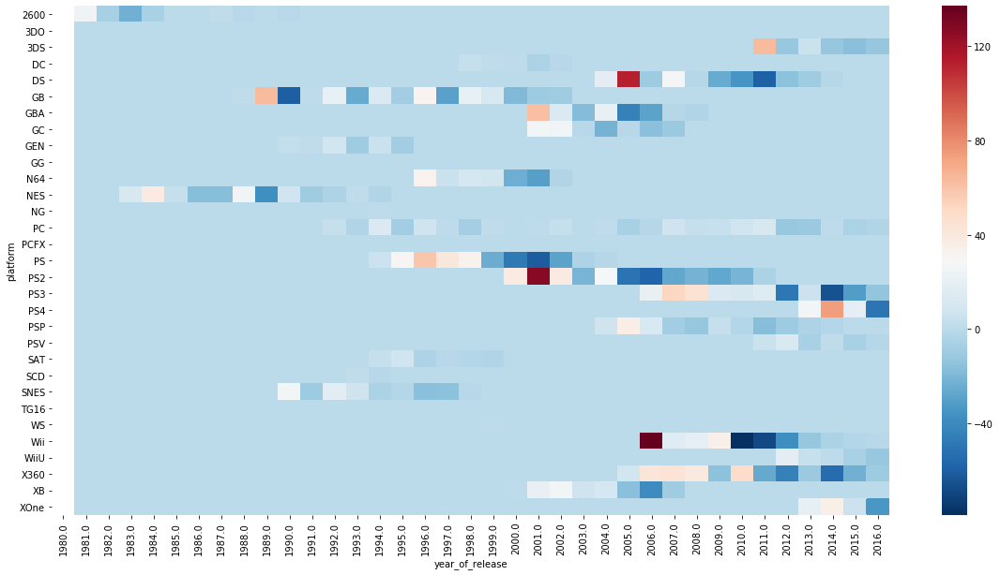

In [86]:
plt.figure(figsize=(20,10))
sns.heatmap(df_sales_year_over_year.T, cmap="RdBu_r")

This heatmap of total_sales by platform over time indicates there are no upward trend in sales for any current gaming platforms.

#### Between 1980 and 1990 ("period 1")

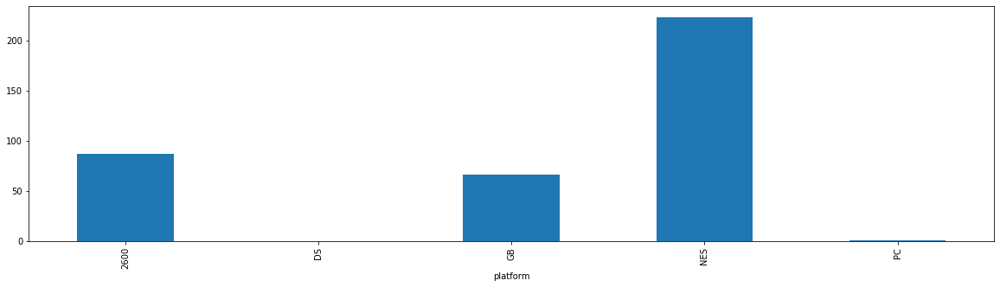

In [87]:
# which platform had highest sales between 1980 and 1990
df_period1 = df.loc[(df['year_of_release'] < 1990)]
df_period1.groupby(['platform'])['total_sales'].sum().plot.bar(figsize=(20,5))

##### Between 1980 and 1990, the Nintendo Entertainment System had the highest game sales

#### Between 1990 and 2000 ("period 2")

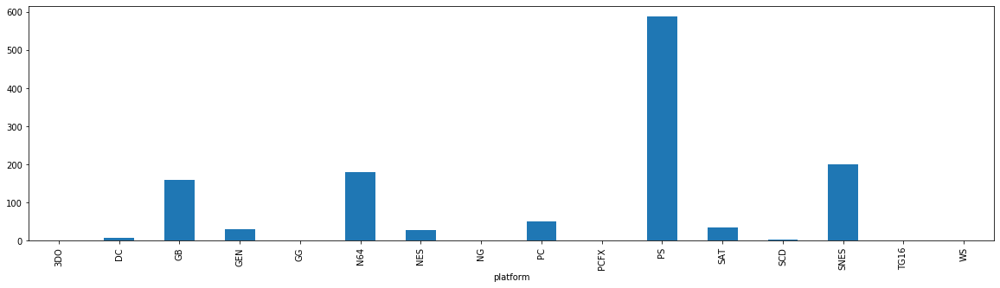

In [88]:
df_period2 = df.loc[(df['year_of_release'] >= 1990) & (df['year_of_release'] < 2000)]

df_period2.groupby(['platform'])['total_sales'].sum().plot.bar(figsize=(20,5))

From 2000 to 2010, the platform with the most game sales was the Playstation.

#### Between 2000 and 2010 ("period 3")

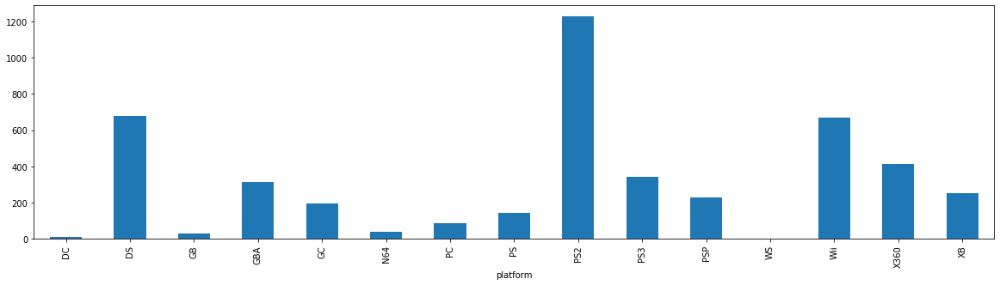

In [89]:
df_period3 = df.loc[(df['year_of_release'] >= 2000) & (df['year_of_release'] < 2010)]

df_period3.groupby(['platform'])['total_sales'].sum().plot.bar(figsize=(20,5))

From 2000 to 2010, the Playstation 2 had the highest game sales.  Second was Ninendo with high sales in the DS and Wii systems.

#### Between 2010 and 2016 ("period 4")

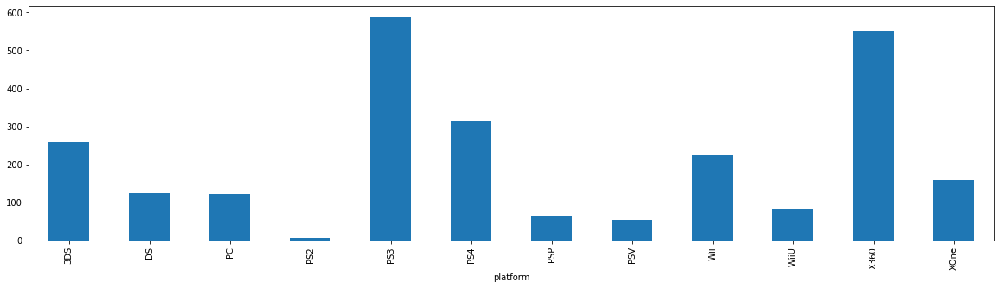

In [90]:
df_period4 = df.loc[(df['year_of_release'] >= 2010)]
df_period4.groupby(['platform'])['total_sales'].sum().plot.bar(figsize=(20,5))

From 2010 to "present" (2016), the Playstation 3 led in sales, followed closely by the XBox 360.  Interestingly, the newer Playstation 4 at the time, having been launched during the Christmas holiday season of 2013, still lagged behind its older brother (PS3).  As an aside, it might be interesting to investigate how long it took subsequent platforms to "take over" from its previous incarnations.

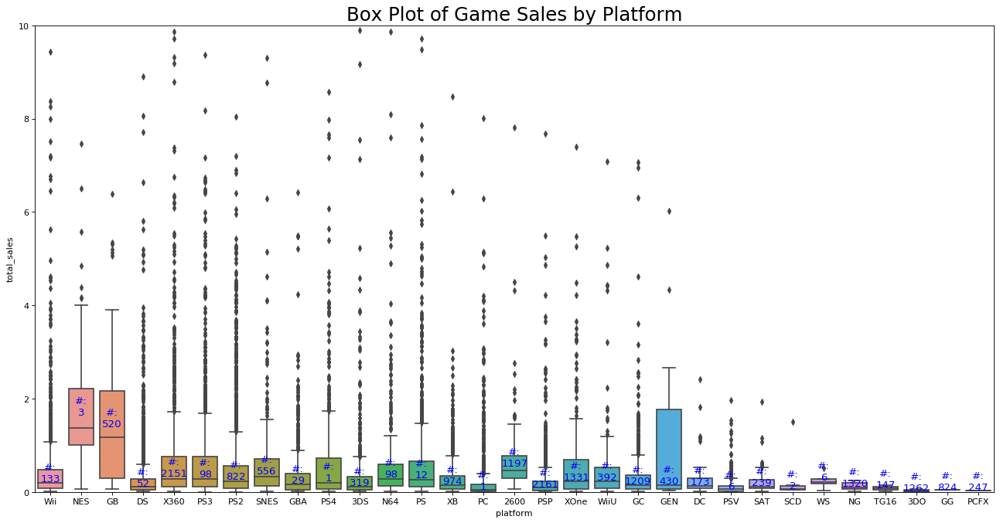

In [91]:
# df_sales_by_platform

# Draw Plot
plt.figure(figsize=(20,10), dpi= 80)
sns.boxplot(x='platform', y='total_sales', data=df, notch=False)

# Add N Obs inside boxplot (optional)
def add_n_obs(df,group_col,y):
    medians_dict = {grp[0]:grp[1][y].median() for grp in df.groupby(group_col)}
    xticklabels = [x.get_text() for x in plt.gca().get_xticklabels()]
    n_obs = df.groupby(group_col)[y].size().values
    for (x, xticklabel), n_ob in zip(enumerate(xticklabels), n_obs):
        plt.text(x, medians_dict[xticklabel]*1.2, "#:\n"+str(n_ob), horizontalalignment='center', fontdict={'size':12}, color='blue')

add_n_obs(df, group_col='platform', y='total_sales')    

# Decoration
plt.title('Box Plot of Game Sales by Platform', fontsize=22)
plt.ylim(0, 10)
plt.show()

#### Boxplot interpretation
We know that the platforms with the highest game sales are the Playstations 1, 2, 3, and XBox 360.  We can see, however, that the interquartile ranges of those platforms are relatively low.  The ones that were higher were the NES, Gameboy and Genesis.

The way I interpret this is that for those three platforms, the games in general sold well, which makes sense, as anecdotally speaking, I remember those systems being big hits.  They were the "next hot toy" that everyone I knew got their hands on.

The way I interpret the Playstations and XBoxes boxplots, with the high number of outliers, is that the popularity of these systems were buoyed by a small number of hit titles -- these would eventually become the franchise games, some of which were exclusive to their original platform.  These franchises were the "killer app" that everyone had to have, thus driving platform sales as a result.

### User profile for each region


#### Top 5 Platforms by region (from 1994 - 2016)

In [92]:
region = {'North America':'na_sales',
          'Europe': 'eu_sales',
          'Japan': 'jp_sales',
          'all other regions': 'other_sales'}
for key in region:
    print('The top five platforms in game sales from 1994 - 2016 for ' + key + ' are:',
         df_new[['platform','name', region[key]]].groupby(['platform']).sum().sort_values(by = region[key], ascending=False).head())
    print()
    

The top five platforms in game sales from 1994 - 2016 for North America are:           na_sales
platform          
X360        595.74
PS2         572.92
Wii         486.87
PS3         390.13
DS          380.31

The top five platforms in game sales from 1994 - 2016 for Europe are:           eu_sales
platform          
PS2         332.63
PS3         327.21
X360        268.32
Wii         258.32
PS          211.19

The top five platforms in game sales from 1994 - 2016 for Japan are:           jp_sales
platform          
DS          175.00
PS2         137.54
PS          137.11
3DS         100.62
PS3          79.41

The top five platforms in game sales from 1994 - 2016 for all other regions are:           other_sales
platform             
PS2            190.47
PS3            134.59
X360            84.88
Wii             77.71
DS              59.04



#### Top platform from 1990 - 2000

In [93]:
for key in region:
    print('The top five platforms in game sales from 1990 - 2000 for ' + key + ' are:',
         df_period2[['platform','name', region[key]]].groupby(['platform']).sum().sort_values(by = region[key], ascending=False).head())
    print()

The top five platforms in game sales from 1990 - 2000 for North America are:           na_sales
platform          
PS          269.01
N64         117.03
GB           63.89
SNES         61.23
PC           29.41

The top five platforms in game sales from 1990 - 2000 for Europe are:           eu_sales
platform          
PS          165.45
N64          34.90
GB           34.49
SNES         19.04
PC           18.98

The top five platforms in game sales from 1990 - 2000 for Japan are:           jp_sales
platform          
PS          119.68
SNES        116.55
GB           55.60
SAT          32.26
N64          25.51

The top five platforms in game sales from 1990 - 2000 for all other regions are:           other_sales
platform             
PS              32.74
GB               5.05
N64              3.27
SNES             3.22
PC               1.49



#### Top platform from 2000 - 2010

In [94]:
for key in region:
    print('The top five platforms in game sales from 2000 - 2010 for ' + key + ' are:',
         df_period3[['platform','name', region[key]]].groupby(['platform']).sum().sort_values(by = region[key], ascending=False).head())
    print()

The top five platforms in game sales from 2000 - 2010 for North America are:           na_sales
platform          
PS2         570.60
Wii         365.67
DS          320.65
X360        261.56
GBA         184.12

The top five platforms in game sales from 2000 - 2010 for Europe are:           eu_sales
platform          
PS2         330.96
Wii         192.41
DS          160.35
PS3         113.61
X360        104.91

The top five platforms in game sales from 2000 - 2010 for Japan are:           jp_sales
platform          
DS          147.10
PS2         136.74
Wii          50.53
GBA          46.56
PSP          33.68

The top five platforms in game sales from 2000 - 2010 for all other regions are:           other_sales
platform             
PS2            189.17
Wii             59.60
DS              50.91
PS3             48.96
X360            37.52



#### Top 5 platform from 2010 to 2016

In [95]:
for key in region:
    print('The top five platforms in game sales from 2010 - 2016 for ' + key + ' are:',
         df_period4[['platform','name', region[key]]].groupby(['platform']).sum().sort_values(by = region[key], ascending=False).head())
    print()

The top five platforms in game sales from 2010 - 2016 for North America are:           na_sales
platform          
X360        334.18
PS3         229.25
Wii         121.20
PS4         108.74
XOne         93.12

The top five platforms in game sales from 2010 - 2016 for Europe are:           eu_sales
platform          
PS3         213.60
X360        163.41
PS4         141.09
PC           68.82
Wii          65.91

The top five platforms in game sales from 2010 - 2016 for Japan are:           jp_sales
platform          
3DS         100.62
PS3          59.26
PSP          42.20
DS           27.90
PSV          21.84

The top five platforms in game sales from 2010 - 2016 for all other regions are:           other_sales
platform             
PS3             85.63
PS4             48.35
X360            47.36
Wii             18.11
XOne            14.27



Since 1994, in North America, the top console is the XBox 360, while in Europe, it is the Playstation 2.  In Japan, the top platform is the Nintendo DS, and the rest of the world, it is the Playstation 2 once again.

Sony is a global conglomerate, and the original Playstation became the leader in the 1990s for many years, long before Microsoft got into the console business.  I think it is natural for a user to stay with the same brand, so many adopted the PS2 when it came out, and with its advances in technology/gameplay, it may have hit the "sweet spot", or Golden Age, of console games, being the dominant platform in the 2000's in every region of the world.

When the first XBox was finally introduced, and being made by a US company, Microsoft, I think North Americans were more open to trying/purchasing it.  Thus, it's not surprising that the XBox 360 was able to get a stronger foothold in North America.  Even if that was the case, however, note that the PS2 only lagged behind by 23 million in game sales for second place.  In the world outside the NA, Sony still dominates, with the exception of Japan, where it appears that Nintendo's portable 3DS has an almost 2 to 1 lead over the next two platforms.  This may speak to the cultural differences in the country compared to NA/EU.

That difference is also evident in that Japan is the only region where role-playing games are the top sellers.  The rest of the world seems to enjoy Action and Sports games more.

#### Top 5 Genres by region

In [96]:
region = {'North America':'na_sales',
          'Europe': 'eu_sales',
          'Japan': 'jp_sales',
          'all other regions': 'other_sales'}
for key in region:
    print('The top five genres in game sales from 1994 - 2016 for ' + key + ' are:',
         df_new[['genre','name', region[key]]].groupby(['genre']).sum().sort_values(by = region[key], ascending=False).head())
    print()
    

The top five genres in game sales from 1994 - 2016 for North America are:          na_sales
genre            
Action     814.11
Sports     655.07
Shooter    527.59
Misc       392.43
Racing     342.82

The top five genres in game sales from 1994 - 2016 for Europe are:          eu_sales
genre            
Action     503.35
Sports     367.35
Shooter    308.23
Racing     230.32
Misc       208.88

The top five genres in game sales from 1994 - 2016 for Japan are:               jp_sales
genre                 
Role-Playing    315.17
Action          146.46
Sports          104.31
Misc             99.51
Platform         77.05

The top five genres in game sales from 1994 - 2016 for all other regions are:          other_sales
genre               
Action        181.15
Sports        131.60
Shooter       102.06
Racing         74.54
Misc           72.85



The top genre in the NA and EU was Action, followed by Sports, while in Japan, Role-Playing was first, followed far behind by Action.  In the rest of the world, Action and Sports were #1 and #2, just like in NA and EU.

The explanation is probably cultural.  Japan has a huge industry in Anime and Manga -- adults read comics openly, and there's just are titles for just about every demographic.  Thus, I do not find it surprising that Role-Playing games are most popular there.



#### Top Genres by Platform

In [97]:
platforms = np.unique(df_period4['platform'])
for each in platforms:
    print('The top genres in game sales on the ' + each + ' are:',
         df_new.loc[df_new.platform == each][['genre','total_sales']].groupby('genre').sum().sort_values(by='total_sales', ascending=False))
    print()

The top genres in game sales on the 3DS are:               total_sales
genre                    
Role-Playing        84.20
Action              57.84
Platform            32.53
Simulation          26.96
Racing              14.87
Misc                10.99
Fighting            10.56
Sports               6.15
Puzzle               5.57
Adventure            4.83
Strategy             2.09
Shooter              1.22

The top genres in game sales on the DS are:               total_sales
genre                    
Misc               135.56
Simulation         129.58
Role-Playing       124.17
Action             111.29
Puzzle              82.09
Platform            75.80
Adventure           45.83
Racing              37.96
Sports              31.27
Strategy            14.27
Shooter              7.86
Fighting             7.08

The top genres in game sales on the PC are:               total_sales
genre                    
Simulation          50.30
Role-Playing        47.25
Strategy            43.54
Shooter

When it comes to sales by genre by platform, we can definitely see how form and function of a platform can determine which games become popular.

The small hand-helds of the 1990's and 2000's such as the Gameboy, DS, 3DS apparently lent themselves well to Action/Platform/Roleplaying games.

The more powerful machines with dedicated controllers, better graphics, and eventually online networking favored the higher performance action/shooter/sports games.

The PC appears to be the only platform where simulations led sales, followed closely by roleplaying and strategy, all of which are slower paced, and can utilize the increased number of keys from a dedicated keyboard.


### Titles on different platforms

In [98]:
df_titles_by_platform = df_new[['platform','name']].groupby('name').count().sort_values(by='platform', ascending=False).reset_index()

In [99]:
df_titles_by_platform.head(25)

,name,platform
0,Need for Speed: Most Wanted,12
1,FIFA 14,9
2,Ratatouille,9
3,LEGO Marvel Super Heroes,9
4,The LEGO Movie Videogame,8
5,Madden NFL 07,8
6,LEGO The Hobbit,8
7,LEGO Star Wars II: The Original Trilogy,8
8,LEGO Jurassic World,8
9,Terraria,8


#### Titles on mulitple platforms tend to be licensed products: sports, Lego, Harry Potter, Star Wars

In [100]:
top_10_multi_platform_titles = df_titles_by_platform['name'].head(10)


In [101]:
top_10_multi_platform_titles

0                Need for Speed: Most Wanted
1                                    FIFA 14
2                                Ratatouille
3                   LEGO Marvel Super Heroes
4                   The LEGO Movie Videogame
5                              Madden NFL 07
6                            LEGO The Hobbit
7    LEGO Star Wars II: The Original Trilogy
8                        LEGO Jurassic World
9                                   Terraria
Name: name, dtype: object

In [102]:
for each in top_10_multi_platform_titles:
    print("Sales of " + each + "across multiple platforms:",
          df_new[df_new['name'] == each][['platform','total_sales']], "\n")

Sales of Need for Speed: Most Wantedacross multiple platforms:       platform  total_sales
253        PS2         4.37
523        PS3         2.81
1190      X360         1.56
1591      X360         1.25
1998        XB         1.04
2048       PSV         1.01
3581        GC         0.56
5972        PC         0.29
6273      WiiU         0.27
6410        DS         0.27
6473       GBA         0.26
11715       PC         0.08 

Sales of FIFA 14across multiple platforms:      platform  total_sales
126       PS3         6.46
271      X360         4.22
469       PS4         3.01
1753     XOne         1.16
4699      PSV         0.41
4809       PC         0.40
4985      Wii         0.38
6871      3DS         0.23
7875      PSP         0.19 

Sales of Ratatouilleacross multiple platforms:       platform  total_sales
1598        DS         1.25
2442       PS2         0.84
3069       PSP         0.65
3902       PS3         0.51
3948       Wii         0.50
6398      X360         0.27
7681       GB

#### Top Games by (recent) Platform

In [103]:
for each in platforms:
    print('The top 10 game sales on the ' + each + ' are:',
         df_new.loc[df_new.platform == each][['name','total_sales']].groupby('total_sales').sum().sort_values(by='total_sales', ascending=False).head(10))
    print()

The top 10 game sales on the 3DS are:                                                   name
total_sales                                           
14.60                              Pokemon X/Pokemon Y
12.65                                     Mario Kart 7
11.68        Pokemon Omega Ruby/Pokemon Alpha Sapphire
10.81                              Super Mario 3D Land
9.90                           New Super Mario Bros. 2
9.17                         Animal Crossing: New Leaf
7.55               Super Smash Bros. for Wii U and 3DS
7.14                                  Pokemon Sun/Moon
5.22                                    Tomodachi Life
4.59                        Luigi's Mansion: Dark Moon

The top 10 game sales on the DS are:                                                      name
total_sales                                              
29.80                               New Super Mario Bros.
24.67                                          Nintendogs
23.21                           

#### The only thing certain about different titles on different platforms is each is different
There are no clear title that is a top seller on every platform.  Each platform has its own top 10.  For titles on multiple platforms, there's usually only a single platform where it performs particularly well.  This could be explained again by the demographic owning the particular platform.

#### Do ESRB ratings affect sales in individual regions?

In [104]:
df_na_ratings = df_new[['na_sales','rating']].sort_values(by='na_sales', ascending=False).head(25).reset_index()

In [105]:
df_na_ratings = df_na_ratings.drop(['index'], axis=1)

In [106]:
df_na_ratings.columns = ['na_sales','na_rating']

In [107]:
df_eu_ratings = df_new[['eu_sales','rating']].sort_values(by='eu_sales', ascending=False).head(25).reset_index()

In [108]:
df_eu_ratings = df_eu_ratings.drop(['index'], axis=1)

In [109]:
df_eu_ratings.columns = ['eu_sales', 'eu_rating']

In [110]:
df_jp_ratings = df_new[['jp_sales','rating']].sort_values(by='jp_sales', ascending=False).head(25).reset_index()

In [111]:
df_jp_ratings = df_jp_ratings.drop(['index'], axis=1)

In [112]:
df_jp_ratings.columns = ['jp_sales', 'jp_rating']

In [113]:
df_other_ratings = df_new[['other_sales','rating']].sort_values(by='other_sales', ascending=False).head(25).reset_index()

In [114]:
df_other_ratings = df_other_ratings.drop(['index'], axis=1)

In [115]:
df_other_ratings.columns = ['other_sales', 'other_rating']

In [116]:
df_regional_ratings = df_na_ratings.merge(df_eu_ratings, left_index=True, right_index=True)

In [117]:
df_regional_ratings = df_regional_ratings.merge(df_jp_ratings, left_index=True, right_index=True)

In [118]:
df_regional_ratings = df_regional_ratings.merge(df_other_ratings, left_index=True, right_index=True)

#### Ratings of each regional top 25 games

In [119]:
df_regional_ratings

,na_sales,na_rating,eu_sales,eu_rating,jp_sales,jp_rating,other_sales,other_rating
0,41.36,E,28.96,E,10.22,NaN,10.57,M
1,15.68,E,12.76,E,7.20,NaN,8.45,E
2,15.61,E,10.95,NaN,6.50,E,7.53,E
3,15.00,E,10.93,E,6.04,NaN,3.96,M
4,14.44,E,9.20,E,5.65,NaN,3.29,E
5,13.96,E,9.18,E,5.38,NaN,2.95,E
6,11.28,E,9.14,E,5.33,E,2.93,E
7,11.27,NaN,9.09,M,5.32,E,2.88,E
8,9.71,E,8.89,NaN,4.87,NaN,2.84,E
9,9.70,M,8.49,E,4.70,E,2.74,NaN


### Effect of ESRB Rating on sales

The above chart of the top 25 selling games by region seem to indicate that the top 5 selling games in:

North America are rated E
Europe are rated E
Japan are also (most likely) rated E (due to the fact that the top platform is the DS, where the games are not subject to ESRB rating system, but can be assumed to be family friendly fare, as mentioned earlier in explanation of why games of certain platforms do not have ratings.

Curiously, the exception to this trend is in the "other" regional sales, where the 2 out of the top 5 games are rated M.

### Effect of Critic Scores on sales

In [120]:
df_ps2_sales = df[df['platform'] == 'PS2']

In [121]:
df_ps2_sales = df_ps2_sales[['genre','critic_score','total_sales']]

In [122]:
df_ps2_sales

,genre,critic_score,total_sales
17,Action,95.000000,20.81
24,Action,95.000000,16.15
28,Racing,95.000000,14.97
38,Action,97.000000,13.10
48,Racing,89.000000,11.65
84,Role-Playing,92.000000,8.04
102,Racing,85.000000,7.20
113,Racing,82.000000,6.90
114,Shooter,88.000000,6.84
132,Role-Playing,85.000000,6.40


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

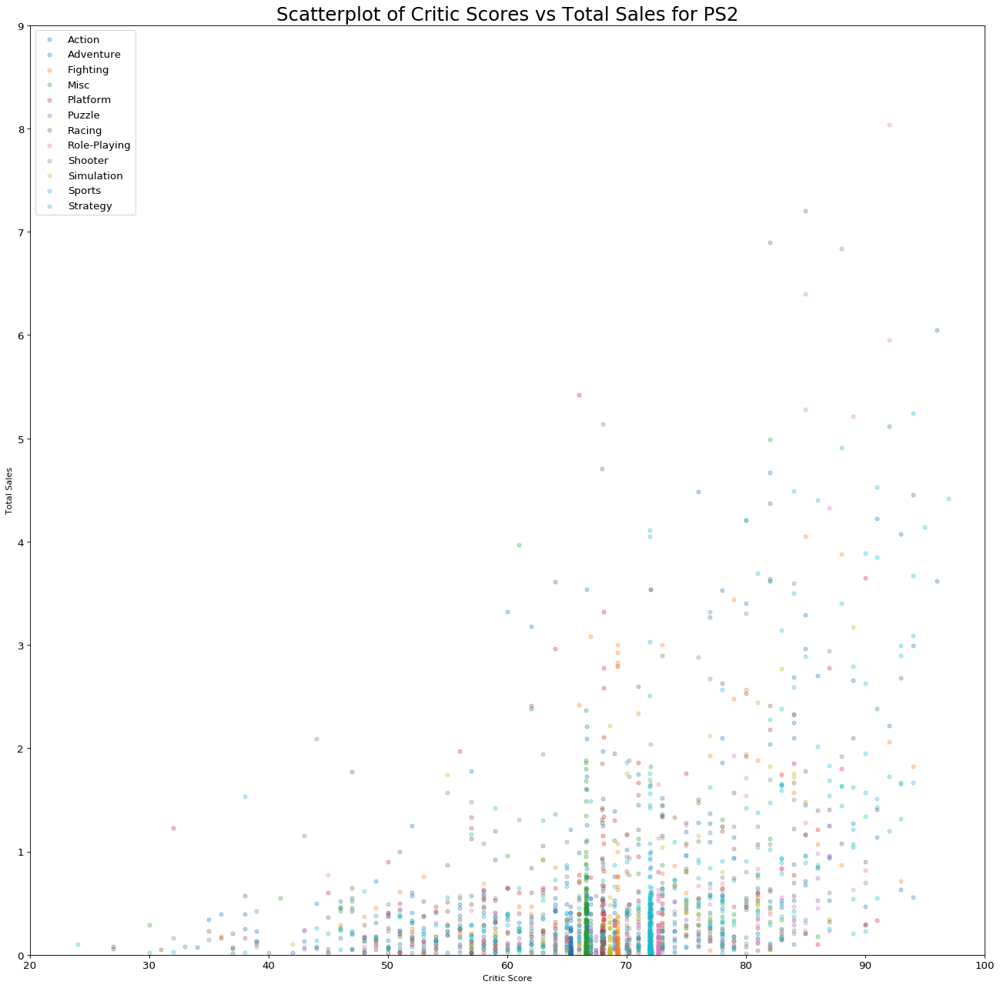

In [123]:

# Create as many colors as there are unique genres
categories = np.unique(df_ps2_sales['genre'])
colors = [plt.cm.tab10(i/float(len(categories)-1)) for i in range(len(categories))]

# Draw Plot for Each Category
plt.figure(figsize=(20, 20), dpi= 80, facecolor='w', edgecolor='k')

for i, category in enumerate(categories):
    plt.scatter('critic_score', 'total_sales', 
                data=df_ps2_sales.loc[df_ps2_sales.genre==category, :], 
                s=20, c=colors[i], label=str(category),
               alpha = 0.3)

# Decorations
plt.gca().set(xlim=(20, 100), ylim=(0, 9),
              xlabel='Critic Score', ylabel='Total Sales')

plt.xticks(fontsize=12); plt.yticks(fontsize=12)
plt.title("Scatterplot of Critic Scores vs Total Sales for PS2", fontsize=22)
plt.legend(fontsize=12)    
plt.show()    

In terms of critic scores affecting sales, there does appear to be a correlation.  We can certainly see that around the 60 point mark and above, there are more sales above the $1 million level.  Below 50, only a small handful of games might do well.

## Test the hypotheses

Average user ratings of the Xbox One and PC platforms are the same.

Average user ratings for the Action and Sports genres are different.


### Obtain average user ratings of XBox One and PC platforms, and ratings of Action and Sports genres

In [124]:
df_xbox_user_ratings = df_new[df_new['platform'] == 'XOne']['user_score']

In [125]:
df_xbox_user_ratings = df_xbox_user_ratings.dropna()

In [126]:
df_pc_user_ratings = df_new[df_new['platform'] == 'PC']['user_score']

In [127]:
df_pc_user_ratings = df_pc_user_ratings.dropna()

In [128]:
df_action_ratings = df_new[df_new['genre'] == 'Action']['user_score']

In [129]:
df_action_ratings = df_action_ratings.dropna()

In [130]:
df_sports_ratings = df_new[df_new['genre'] == 'Sports']['user_score']

In [131]:
df_sports_ratings = df_sports_ratings.dropna()

### Null Hypothesis # 1

Average user ratings of the Xbox One and PC platforms are the same

In [132]:
alpha = .05 # critical statistical significance level
            # if the p-value is less than alpha, we reject the hypothesis

results = st.ttest_ind(
        df_xbox_user_ratings, 
        df_pc_user_ratings)

print('p-value: ', results.pvalue)

if (results.pvalue < alpha):
        print("We reject the null hypothesis")
else:
        print("We can't reject the null hypothesis")

p-value:  0.005711575715916348
We reject the null hypothesis


### Null Hypothesis # 2

Average user ratings for the Action and Sports genres are the same

In [133]:
alpha = .05 # critical statistical significance level
            # if the p-value is less than alpha, we reject the hypothesis

results = st.ttest_ind(
        df_action_ratings, 
        df_sports_ratings)

print('p-value: ', results.pvalue)

if (results.pvalue < alpha):
        print("We reject the null hypothesis")
else:
        print("We can't reject the null hypothesis")

p-value:  3.5138864794224173e-14
We reject the null hypothesis


## Overall Conclusion



The history of gaming consoles is quite long, and it's interesting to see how a platform appears, (possibly) gains popularity, and then die off.  Of the top platforms, game sales all seem to follow more or less a normal distribution.  Our current analysis does not really indicate any set rules on how long a platform lasts -- some longer than others, some much, much shorter -- but anywhere from 3-5 years for short-lived platforms, to 8-12 years for the popular ones.  There are other variables that would need to be considered as well for a more thorough analysis, something that is beyond the scope of this study.  (Factors such as the advent of smartphones/tablets, graphics/gameplay realism threshold and cultural/societal differences or changes come to mind)

Game sales do appear to vary from platform to platform, however, and some possible explanations are that certain platforms are geared toward a more niche market, such as the DS, and certain fan-favorite gaming franchises belong exclusively to certain platforms, so if a strong following develops for one game, we can expect the sequels to sell well.  Again, this could be a topic for another deeper analysis.

Since 1994, in North America, the top console is the XBox 360, while in Europe, it is the Playstation 2.  In Japan, the top platform is the Nintendo DS, and the rest of the world, it is the Playstation 2 once again.  However, if we go decade by decade, those top platforms change as indicated above.

It would seem that Sony's Playstation 2 really hit the sweet spot in the 2000's, culminating in the maximum sales in 2008-2009.  It was the dominant platform worldwide for a good decade, before Microsoft finally got into the console business with some good game hits. 

Being made by a US company, I think North Americans were more open to trying/purchasing the XBox series.  Thus, it's not surprising that the XBox 360 was able to get a stronger foothold in North America.  Even if that was the case, however, note that the PS2 only lagged behind by 23 million in game sales for second place.  In the world outside the NA, Sony still dominates, with the exception of Japan, where it appears that Nintendo's portable 3DS has an almost 2 to 1 lead over the next two platforms.  This may speak to the cultural differences in the country compared to NA/EU.

That difference is also evident in that Japan is the only region where role-playing games are the top sellers.  The rest of the world seems to enjoy Action and Sports games more.

In terms ESRB ratings, for the most part, an E-rated game sells the most in general.  However, critic scores do seem to have a correlation with sales.  The better scored games tend to have higher sales.

Having titles available on multiple platforms do not mean that sales for each are similar.  In fact, the data shows that usually one platform will do much better than all the rest.  It seems to depend on the game.

Take a look at the general distribution of games by genre. What can we say about the most profitable genres? Can you generalize about genres with high and low sales?

The most popular genres are Action, Sports, Shooter, Role-Playing.  These titles can be more involved, usually including some type of "campaign" or "story" mode, or they can be networked for users to play with or against one another.

On the other hand, the bottom selling games are Adventure, Stratgey, Puzzle.  They appear to be more casual games that anyone can play for a short spurt at any time, and thus not be so devoted.

For the top games, there are a plethora of sequels, which the game companies are banking on user loyalty to continue purchasing.



## 2017 Prognosis

Based on the data, we should make purchases based on our groupings of sales by genre and platform.  The overall trend seems to be downward, possibly due to outside variables such as the advent of more powerful smartphones and tablets.  There are also other "distractions" that may be affecting user interest, such as streaming services.

Therefore, a focus should be made on retaining repeat buyers of certain game franchises, such as selling quality accessories for network playing (headsets, chairs, controllers, keyboards, etc).

Critic scores appear to be a good indicator of whether a title sells well, so we can take that into account when stocking new or unknown (to a particular region) games.

In rejecting both our Null Hypotheses, we can only conclude that predicting game sales is not an exact science.  It would be best to take say the top ten titles of each platform, with a nod to genres, in deciding how to stock future games.
